# Combine datasets into a single spatially unified dataset 

In [2]:
## Import libraries
# system
import os
import time
import sys
from collections import deque

# data manipulation
import json
import yaml
import numpy as np
import geopandas as gpd
import pandas as pd
import rasterio as rio
from rasterio.enums import Resampling
import rioxarray as rxr # adds rioxarray capabilities to xarray
import xarray as xr
from shapely.geometry import shape
import utm
from pyproj import CRS

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

# local imports
from data_acquisition.cube.combine import combine_region_datasets

###### setup config variables #######
repo_name = 'masterthesis_genai_spatialplan'
if not repo_name in os.getcwd():
    os.chdir(repo_name)

p=os.popen('git rev-parse --show-toplevel')
repo_dir = p.read().strip()
p.close()

# Import helper functions
sys.path.append(f"{repo_dir}/code/helpers")
from helpers.get_region_filenames import get_region_filenames

with open(f"{repo_dir}/code/data_acquisition/config.yml", 'r') as stream:
    config = yaml.safe_load(stream)

regions = config['regions'] 

big_data_storage_path = config.get("big_data_storage_path", "/work/zt75vipu-master/data")
region_filenames_json = get_region_filenames(config)
print("Region filenames JSON loaded successfully: ", region_filenames_json)

#seaborn cmap
rocket=sns.color_palette("rocket", as_cmap=True)
mako=sns.color_palette("mako", as_cmap=True)

Regions to process: ['Dresden', 'Leipzig', 'Hamburg', 'Stuttgart']
Region filenames JSON loaded successfully:  {'Dresden': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/dresden/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/dresden/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/dresden/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/dresden/input_config_ge25_cc10_2019_2024.zarr'}, 'Leipzig': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/leipzig/landsat_temperature_ge25_cc10_2019_2024.zarr', 'osm_zarr_name': 'D:/master_thesis/data/osm/leipzig/osm_rasterized.zarr', 'planet_zarr_name': 'D:/master_thesis/data/planet_scope/leipzig/planet_config_ge25_cc10_2019_2024.zarr', 'processed_zarr_name': 'D:/master_thesis/data/processed/leipzig/input_config_ge25_cc10_2019_2024.zarr'}, 'Hamburg': {'landsat_zarr_name': 'D:/master_thesis/data/landsat/hamburg/landsat_te

In [9]:
filenames = region_filenames_json["Leipzig"]
processed_zarr_name = filenames['processed_zarr_name']
processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")

In [ ]:
combine_region_datasets(
    region="Leipzig",
    repo_dir=repo_dir,
    big_data_storage_path=big_data_storage_path,
    filenames=filenames
)

# for region in regions:
#     print(f"Processing region: {region}")
#     combine_region_datasets(
#         region=region,
#         repo_dir=repo_dir,
#         big_data_storage_path=big_data_storage_path,
#         filenames=region_filenames_json[region]
#     )

/tmp/ipykernel_3469503/2881183663.py:47: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])


UTM CRS: ('EPSG', '32632') with zone 32U
Urban areas file already exists at /work/zt75vipu-thesis/data/corine/hamburg/urban_areas.zarr. Loading existing file.


/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/numcodecs/__init__.py:129: UserWarning: NumPy version >= 2.0.0 detected. The zfpy library is incompatible with this version of NumPy. Please downgrade to NumPy < 2.0.0 or wait for an update from zfpy.
  from numcodecs.zfpy import ZFPY


CRS of OSM dataset: EPSG:4326
Reprojecting and resampling datasets to common grid...
Target CRS: EPSG:32632
Merging datasets...
Saving processed Zarr file...


/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/dask/array/core.py:5061: PerformanceWarning: Increasing number of chunks by factor of 10
  result = blockwise(
/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/dask/array/core.py:5061: PerformanceWarning: Increasing number of chunks by factor of 10
  result = blockwise(
/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/zarr/core/dtype/npy/string.py:248: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=5, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the sta

Processed Zarr file saved at /work/zt75vipu-thesis/data/processed/hamburg/input_config_ge25_cc10_2019_2024.zarr.
Clipping merged dataset to urban areas...


/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/zarr/core/dtype/npy/string.py:248: UnstableSpecificationWarning: The data type (FixedLengthUTF32(length=5, endianness='little')) does not have a Zarr V3 specification. That means that the representation of arrays saved with this data type may change without warning in a future version of Zarr Python. Arrays stored with this data type may be unreadable by other Zarr libraries. Use this data type at your own risk! Check https://github.com/zarr-developers/zarr-extensions/tree/main/data-types for the status of data type specifications for Zarr V3.
  v3_unstable_dtype_warning(self)
/home/sc.uni-leipzig.de/zt75vipu/.conda/envs/genaiSpatialplan/lib/python3.11/site-packages/zarr/api/asynchronous.py:244: ZarrUserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


In [ ]:
merged_xs_clipped = xr.open_zarr(processed_zarr_name_clipped, consolidated=True)

Max: 59.438018798828125, Min: 22.835363388061523


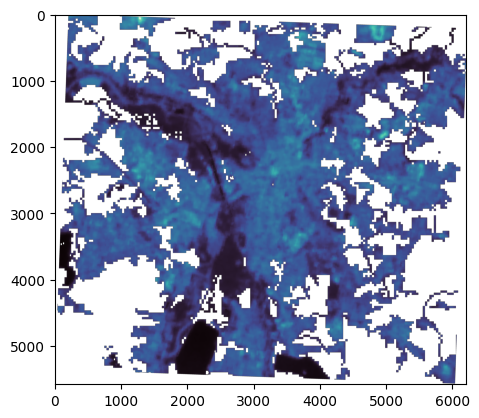

In [11]:
values = merged_xs_clipped.landsat_surface_temp_b10_masked.isel(time=0).values
max = np.nanmax(values)
min = np.nanmin(values)
print(f"Max: {max}, Min: {min}")
plt.imshow(values, cmap='mako', vmin=min, vmax=max)

In [12]:
merged_xs_clipped

<xarray.Dataset> Size: 5GB
Dimensions:                           (y: 5580, x: 6211, time: 4, channel: 4)
Coordinates:
  * y                                 (y) float64 45kB 5.699e+06 ... 5.682e+06
  * x                                 (x) float64 50kB 3.078e+05 ... 3.264e+05
  * time                              (time) datetime64[ns] 32B 2019-06-24T10...
  * channel                           (channel) <U5 80B 'blue' 'green' ... 'nir'
    spatial_ref                       int64 8B ...
Data variables: (12/15)
    building_shapes                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    building_shapes_elongation        (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    building_shapes_structural_types  (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings                         (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_heights                 (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_service                 (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    ...                                ...
    planetscope_sr_4band              (time, channel, y, x) float32 2GB dask.array<chunksize=(1, 4, 1024, 1024), meta=np.ndarray>
    street_blocks                     (y, x) float64 277MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets                           (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_service                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_surface                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    water                             (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>

In [20]:
merged_xs_clipped.rio.crs

CRS.from_wkt('PROJCS["unknown",GEOGCS["unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]')

In [35]:
############ Define the bbox ############ 
from data_acquisition.cube.metropolitan_regions import get_region_bbox


region ="Leipzig"

############ Define the bbox ############ 
bbox_gdf = get_region_bbox(region=region, repo_dir=repo_dir)
bbox_polygon=json.loads(bbox_gdf.to_json())['features'][0]['geometry']
bbox = bbox_gdf.total_bounds
coordinates=json.loads(bbox_gdf.geometry.to_json())["features"][0]["geometry"]["coordinates"]

# Define UTM CRS for the region (e.g. 33N)
easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])
is_south = zone_letter < 'N'  # True for southern hemisphere
utm_crs = CRS.from_dict({'proj': 'utm', 'zone': int(zone_number), 'south': is_south})
print(f"UTM CRS: {utm_crs.to_authority()} with zone {zone_number}{zone_letter}")

bbox_gdf = bbox_gdf.to_crs(utm_crs)

xmin, ymin, xmax, ymax = bbox_gdf.total_bounds

x_center = (xmin + xmax) / 2
y_center = (ymin + ymax) / 2

# define a smaller bounding box around the center
box_size = 800 # m  # adjust this value as needed
xmin = x_center - box_size
xmax = x_center + box_size
ymin = y_center - box_size
ymax = y_center + box_size

print(f"Subset bounds: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")

UTM CRS: ('EPSG', '32633') with zone 33U
Subset bounds: xmin=316297.9461047712, xmax=317897.9461047712, ymin=5689508.433003593, ymax=5691108.433003593


C:\Users\janne\AppData\Local\Temp\ipykernel_51216\681755787.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  easting, northing, zone_number, zone_letter = utm.from_latlon(bbox_gdf.geometry.centroid.y.values[0], bbox_gdf.geometry.centroid.x.values[0])


In [23]:
merged_xs_clipped

<xarray.Dataset> Size: 5GB
Dimensions:                           (y: 5580, x: 6211, time: 4, channel: 4)
Coordinates:
  * y                                 (y) float64 45kB 5.699e+06 ... 5.682e+06
  * x                                 (x) float64 50kB 3.078e+05 ... 3.264e+05
  * time                              (time) datetime64[ns] 32B 2019-06-24T10...
  * channel                           (channel) <U5 80B 'blue' 'green' ... 'nir'
    spatial_ref                       int64 8B ...
Data variables: (12/15)
    building_shapes                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    building_shapes_elongation        (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    building_shapes_structural_types  (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings                         (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_heights                 (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_service                 (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    ...                                ...
    planetscope_sr_4band              (time, channel, y, x) float32 2GB dask.array<chunksize=(1, 4, 1024, 1024), meta=np.ndarray>
    street_blocks                     (y, x) float64 277MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets                           (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_service                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_surface                   (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    water                             (y, x) float32 139MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>

In [36]:
merged_xs_clipped_subset = merged_xs_clipped.sel(x=slice(xmin, xmax), y=slice(ymax, ymin))
merged_xs_clipped_subset

<xarray.Dataset> Size: 42MB
Dimensions:                           (y: 534, x: 533, time: 4, channel: 4)
Coordinates:
  * y                                 (y) float64 4kB 5.691e+06 ... 5.69e+06
  * x                                 (x) float64 4kB 3.163e+05 ... 3.179e+05
  * time                              (time) datetime64[ns] 32B 2019-06-24T10...
  * channel                           (channel) <U5 80B 'blue' 'green' ... 'nir'
    spatial_ref                       int64 8B ...
Data variables: (12/15)
    building_shapes                   (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    building_shapes_elongation        (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    building_shapes_structural_types  (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    buildings                         (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    buildings_heights                 (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    buildings_service                 (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    ...                                ...
    planetscope_sr_4band              (time, channel, y, x) float32 18MB dask.array<chunksize=(1, 4, 534, 233), meta=np.ndarray>
    street_blocks                     (y, x) float64 2MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    streets                           (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    streets_service                   (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    streets_surface                   (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>
    water                             (y, x) float32 1MB dask.array<chunksize=(534, 233), meta=np.ndarray>

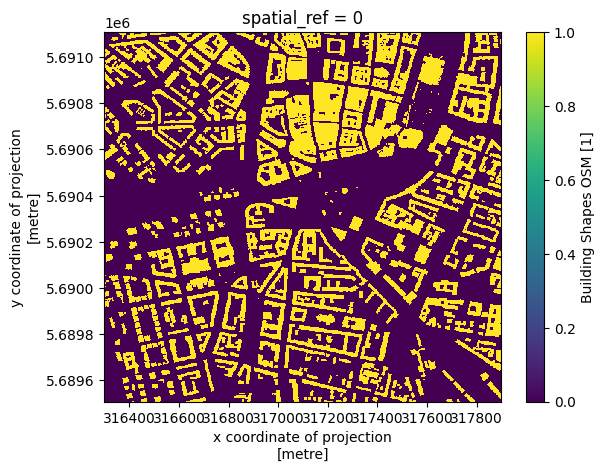

In [38]:
merged_xs_clipped_subset.building_shapes.plot()

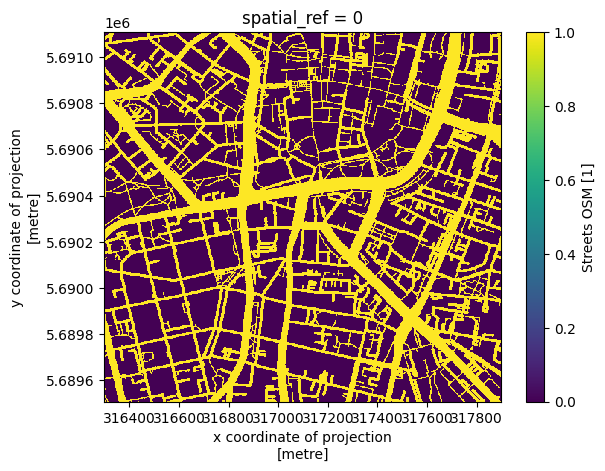

In [37]:
merged_xs_clipped_subset.streets.plot()

In [4]:
processed_zarr_name = get_region_filenames(config_path=f"{repo_dir}/code/data_acquisition/config.yml")[regions[3]]['processed_zarr_name']
merged_xs = xr.open_zarr(processed_zarr_name, consolidated=True)

processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")
merged_xs_clipped = xr.open_zarr(processed_zarr_name_clipped, consolidated=True)

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg', 'Stuttgart']


In [4]:
merged_xs_clipped

<xarray.Dataset> Size: 13GB
Dimensions:                          (time: 5, y: 9148, x: 8868, channel: 4)
Coordinates:
  * time                             (time) datetime64[ns] 40B 2019-07-24T10:...
  * y                                (y) float64 73kB 5.42e+06 ... 5.392e+06
  * x                                (x) float64 71kB 5.059e+05 ... 5.325e+05
  * channel                          (channel) <U5 80B 'blue' 'green' ... 'nir'
    spatial_ref                      int64 8B ...
Data variables:
    landsat_surface_temp_b10_masked  (time, y, x) float32 2GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    buildings                        (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    buildings_heights                (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets                          (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    ndvi                             (time, y, x) float32 2GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
    buildings_service                (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    planetscope_sr_4band             (time, channel, y, x) float32 6GB dask.array<chunksize=(1, 4, 1024, 1024), meta=np.ndarray>
    landuse                          (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_service                  (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    streets_surface                  (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    water                            (y, x) float32 324MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    street_blocks                    (y, x) float64 649MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>

Max: 60.102088928222656, Min: 29.631820678710938


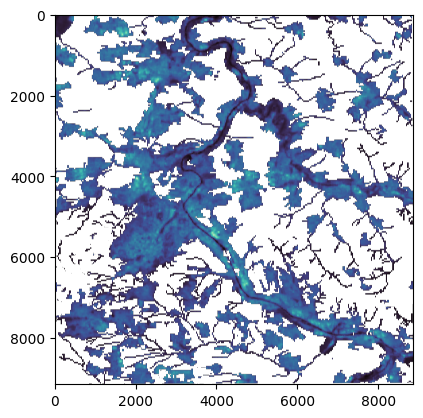

In [9]:
values = merged_xs_clipped.landsat_surface_temp_b10_masked.isel(time=0).values
max = np.nanmax(values)
min = np.nanmin(values)
print(f"Max: {max}, Min: {min}")
plt.imshow(values, cmap='mako', vmin=min, vmax=max)

Number of valid PlanetScope dates: 1


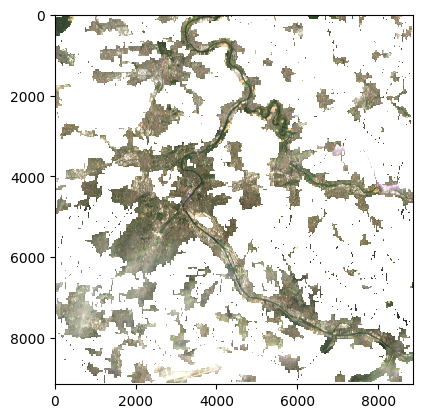

In [6]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs_clipped['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs_clipped['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs_clipped.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

In [7]:
raise Exception("Stop here") 

Exception: Stop here

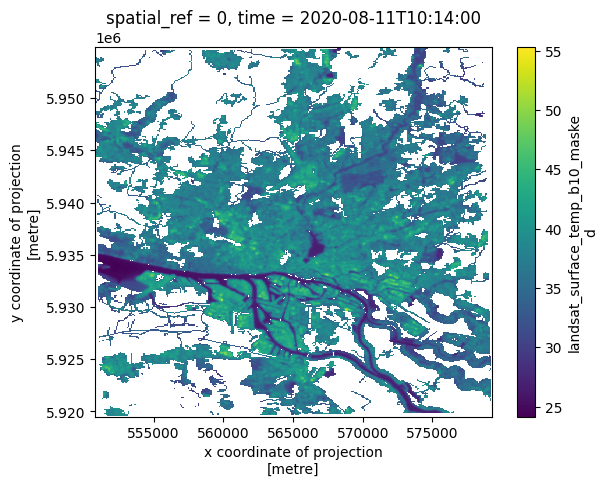

In [ ]:
merged_xs_clipped.isel(time=0).landsat_surface_temp_b10_masked.plot()

Number of valid PlanetScope dates: 2


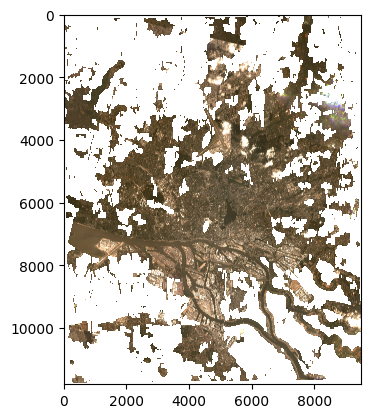

In [ ]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs_clipped['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs_clipped['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs_clipped.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

Number of valid PlanetScope dates: 2


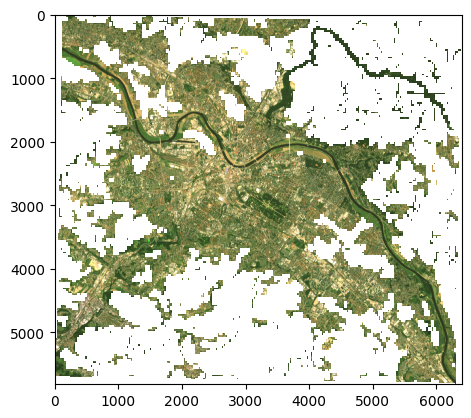

In [ ]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs_clipped['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs_clipped['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs_clipped.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

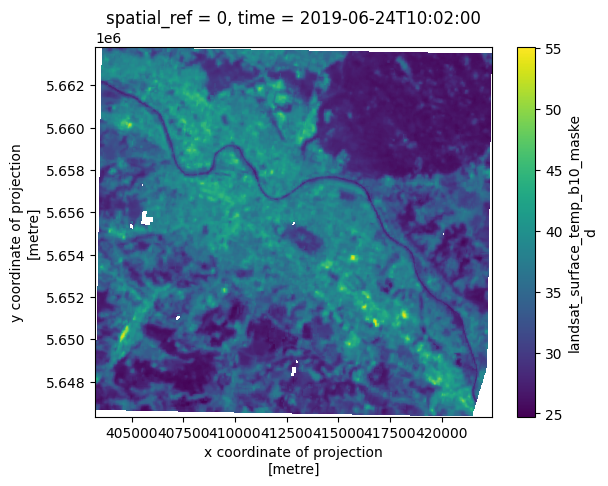

In [ ]:
merged_xs.isel(time=0).landsat_surface_temp_b10_masked.plot()

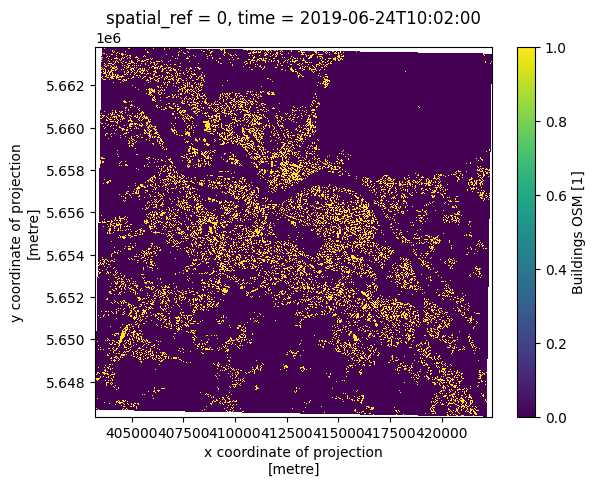

In [ ]:
merged_xs.isel(time=0).shapes.plot()

Number of valid PlanetScope dates: 2


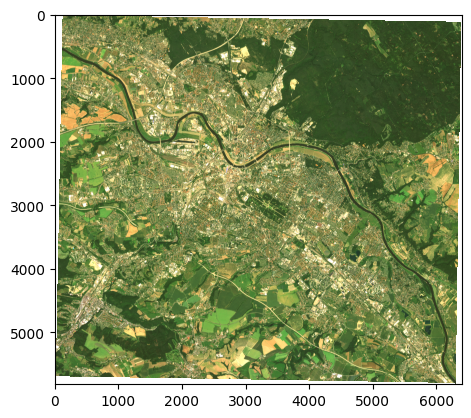

In [ ]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

Getting region filenames from config...
Regions to process: ['Dresden', 'Leipzig', 'Hamburg', 'Stuttgart']
Number of valid PlanetScope dates: 2


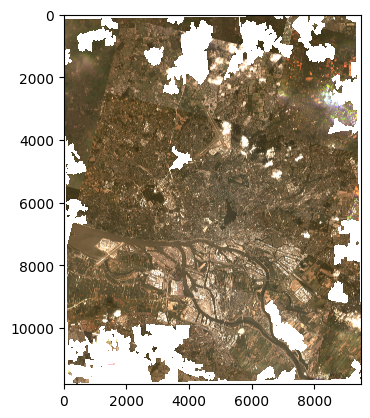

In [ ]:
processed_zarr_name = get_region_filenames(config_path=f"{repo_dir}/code/data_acquisition/config.yml")[regions[2]]['processed_zarr_name']
merged_xs = xr.open_zarr(processed_zarr_name, consolidated=True)

processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")
merged_xs_clipped = xr.open_zarr(processed_zarr_name_clipped, consolidated=True)

# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs_clipped.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

In [ ]:
# get all dates where not null count of planet bands >0
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values
print(f"Number of valid PlanetScope dates: {len(valid_planet_dates)}")

reflectance = merged_xs_clipped.planetscope_sr_4band.sel(time=valid_planet_dates[0])

rgb = np.stack([
    reflectance.isel(channel=2),
    reflectance.isel(channel=1),
    reflectance.isel(channel=0)
], axis=-1)

rgb = np.clip(rgb / np.nanpercentile(rgb, 98), 0, 1)
plt.imshow(rgb)
plt.show()
plt.close()

In [ ]:
processed_zarr_name = get_region_filenames(config_path=f"{repo_dir}/code/data_acquisition/config.yml")[regions[3]]['processed_zarr_name']
merged_xs = xr.open_zarr(processed_zarr_name, consolidated=True)

processed_zarr_name_clipped = processed_zarr_name.replace(".zarr", "_clipped.zarr")
merged_xs_clipped = xr.open_zarr(processed_zarr_name_clipped, consolidated=True)

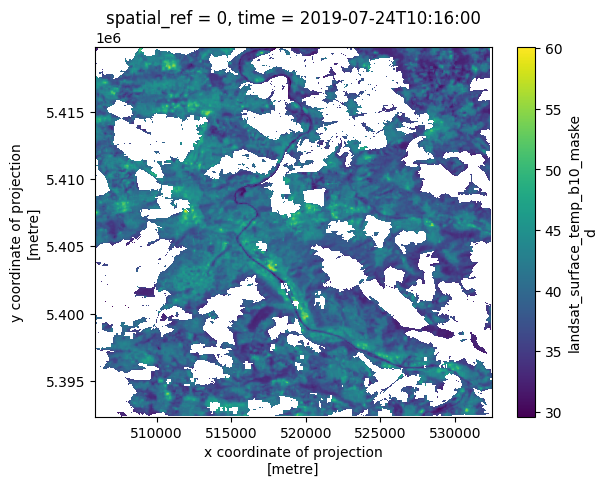

In [ ]:
merged_xs_clipped.isel(time=0).landsat_surface_temp_b10_masked.plot()

### Plot side by side

In [ ]:
from functools import reduce
import random
import json

def plot_img_array(img_array, ncol=3):
    nrow = len(img_array) // ncol

    f, plots = plt.subplots(nrow, ncol, sharex='all', sharey='all', figsize=(ncol * 4, nrow * 4))

    for i in range(len(img_array)):
        plots[i // ncol, i % ncol]
        plots[i // ncol, i % ncol].imshow(img_array[i])

def plot_side_by_side(img_arrays):
    flatten_list = reduce(lambda x,y: x+y, zip(*img_arrays))

    plot_img_array(np.array(flatten_list), ncol=len(img_arrays))

In [ ]:
def mask_to_colorimg(mask, class_dict=None, custom_colors=None, random_seed=42):
    """
    Convert a class mask to a colored image.
    
    Args:
        mask: 2D numpy array with class indices
        class_dict: Dictionary mapping class indices to class names (optional)
        custom_colors: Optional dict mapping class values to RGB colors
        random_seed: Seed for random color generation to ensure consistency
    
    Returns:
        RGB image as numpy array with shape (height, width, 3)
    """
    # Set random seed for reproducible colors
    random.seed(random_seed)
    
    # Generate distinct colors 
    if custom_colors is None:
        distinct_colors = [
            [0,0,0],      # Black
            [255, 0, 0],    # Red
            [0, 255, 0],    # Green
            [0, 0, 255],    # Blue
            [255, 255, 0],  # Yellow
            [255, 0, 255],  # Magenta
            [0, 255, 255],  # Cyan
            [128, 0, 0],    # Maroon
            [0, 128, 0],    # Dark Green
            [0, 0, 128],    # Navy
            [128, 128, 0],  # Olive
            [128, 0, 128],  # Purple
            [0, 128, 128],  # Teal
            [192, 192, 192],# Silver
            [128, 128, 128],# Gray
            [255, 165, 0],  # Orange
        ]
        
        # Map each class to a color
        color_map = {}
        if class_dict is not None:
            # map classes to colors
            for i, class_label in enumerate(class_dict.values()):
                if i < len(distinct_colors):
                    color_map[class_label] = distinct_colors[i]
                else:
                    # Fall back to random colors if more classes than distinct colors
                    color_map[class_label] = [random.randint(0, 255) for _ in range(3)]
        else:
            # use unique values from the mask
            unique_values = np.unique(mask)
            for i, val in enumerate(unique_values):
                if i < len(distinct_colors):
                    color_map[val] = distinct_colors[i]
                else:
                    color_map[val] = [random.randint(0, 255) for _ in range(3)]
    else:
        # Use custom color mapping if provided
        color_map = custom_colors
    
    # Default color for undefined classes
    default_color = [0, 0, 0]  # Black
    
    # Convert the mask to a color image
    flat_mask = mask.flatten()
    colorimg = np.array([color_map.get(val, default_color) for val in flat_mask])
    
    return colorimg.reshape(mask.shape + (3,))

In [ ]:
# get valid planet dates
valid_planet_dates = (merged_xs['planetscope_sr_4band'].notnull().sum(dim=['x', 'y']) > 0).any(dim='channel').compute()
valid_planet_dates = merged_xs['time'].where(valid_planet_dates, drop=True).values

# Load the rgb bands from PlanetScope
planet_data = merged_xs.planetscope_sr_4band.sel(time=valid_planet_dates[0])
blue_band = planet_data.sel(channel='blue')
green_band = planet_data.sel(channel='green')
red_band = planet_data.sel(channel='red')
nir_band = planet_data.sel(channel='nir')

# Stack these into an RGB image for input
rgb_image = np.stack([red_band, green_band, blue_band], axis=-1) 

# Percentile-based contrast stretch
p_low, p_high = 2, 98
rgb_min = np.nanpercentile(rgb_image, p_low)
rgb_max = np.nanpercentile(rgb_image, p_high)
rgb_image = np.clip((rgb_image - rgb_min) / (rgb_max - rgb_min), 0, 1)


# Load target masks for landuse, shapes, and streets
ndvi_mask = merged_xs.ndvi.sel(time=valid_planet_dates[0]).values
landuse_mask = merged_xs.landuse.values
shapes_mask = merged_xs.shapes.values
shapes_service_mask = merged_xs.shapes_service.values
shapes_height_mask = merged_xs.shapes_heights.values
streets_mask = merged_xs.streets.values
streets_surface_mask = merged_xs.streets_surface.values
streets_service_mask = merged_xs.streets_service.values
water_mask = merged_xs.water.values
# lst_mask = merged_xs.landsat_surface_temp_b10_masked.drop_sel(time=merged_xs.planetscope_sr_4band.time[1].values).sel(time=pd.to_datetime(merged_xs.planetscope_sr_4band.time[1].values), method="nearest").values
lst_mask = merged_xs.landsat_surface_temp_b10_masked.sel(time=valid_planet_dates[0]).values

In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
# Convert masks to RGB
ndvi_mask_rgb = mask_to_colorimg(ndvi_mask, custom_colors={0: [0, 0, 0], 1: [0, 255, 0]})
landuse_mask_rgb = mask_to_colorimg(landuse_mask, json.loads(merged_xs.landuse.attrs["landuse_mapping"]))
shapes_mask_rgb = mask_to_colorimg(shapes_mask)
shapes_services_mask_rgb = mask_to_colorimg(shapes_service_mask, json.loads(merged_xs.shapes_service.attrs["shapes_service_mapping"]))
shapes_height_mask_rgb = mask_to_colorimg(shapes_height_mask)
streets_mask_rgb = mask_to_colorimg(streets_mask)
streets_surface_mask_rgb = mask_to_colorimg(streets_surface_mask, json.loads(merged_xs.streets_surface.attrs["streets_surface_mapping"]))
streets_service_mask_rgb = mask_to_colorimg(streets_service_mask, json.loads(merged_xs.streets_service.attrs["streets_service_mapping"]))
water_mask_rgb = mask_to_colorimg(water_mask, json.loads(merged_xs.water.attrs["water_mapping"]))

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

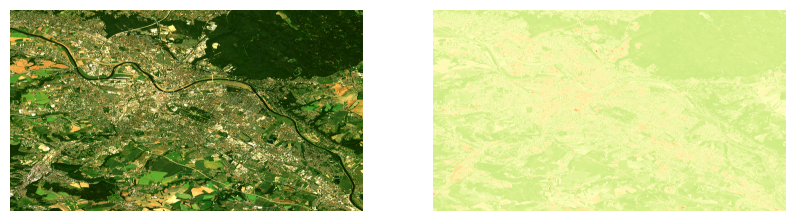

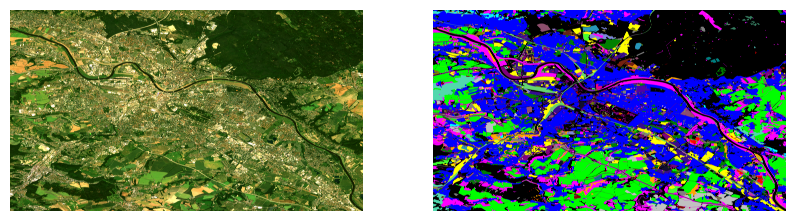

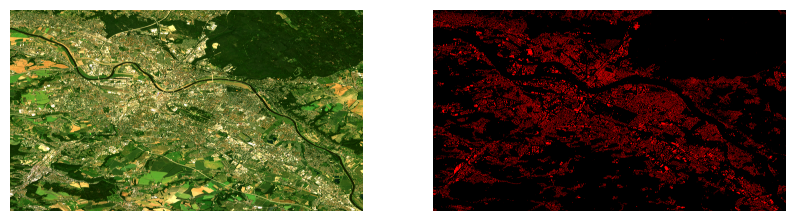

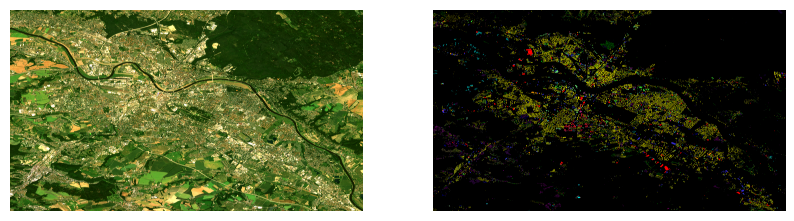

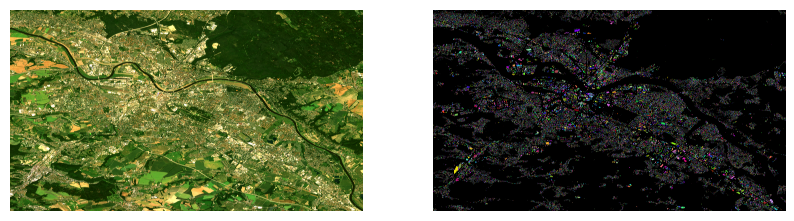

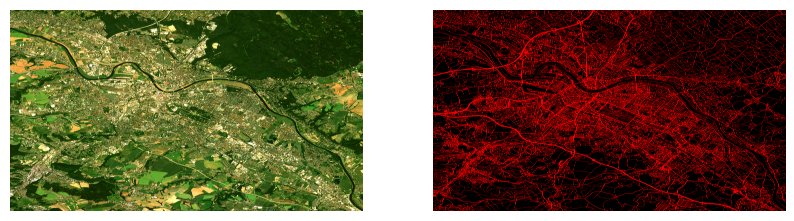

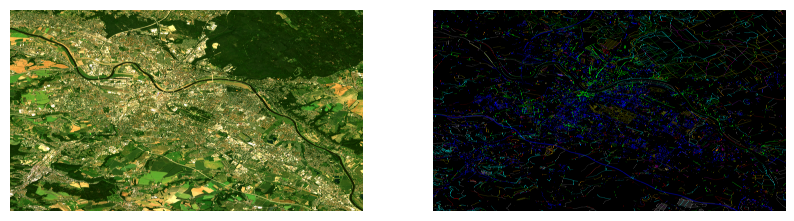

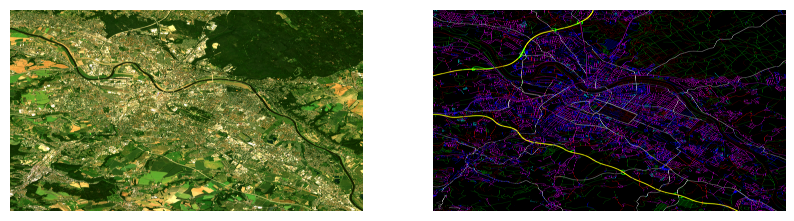

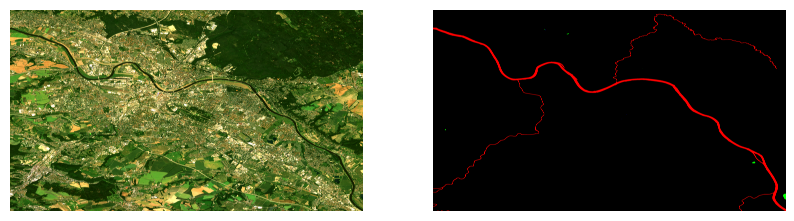

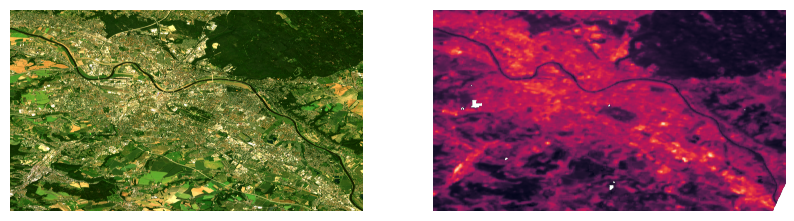

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

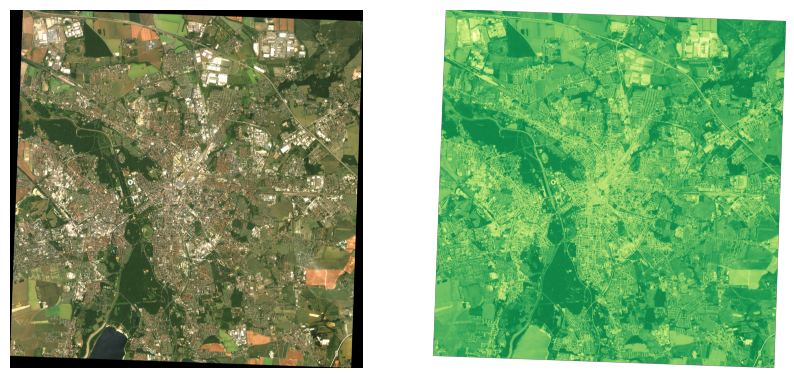

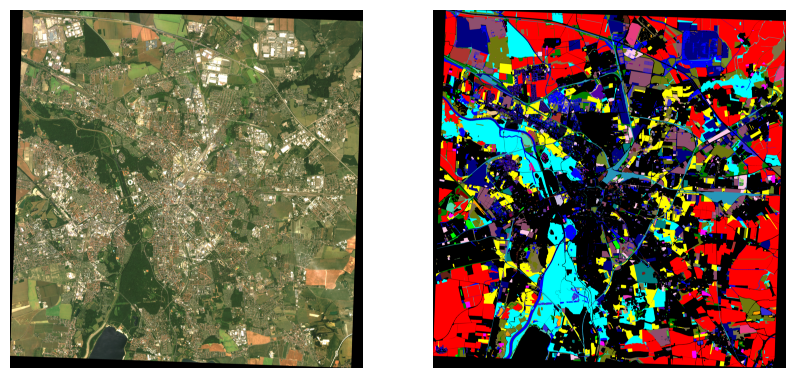

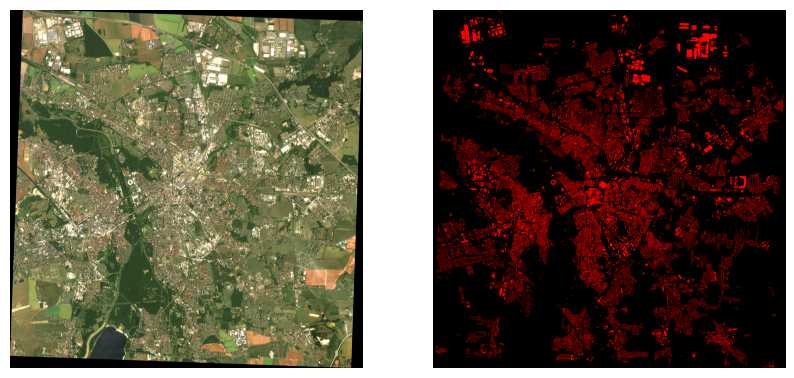

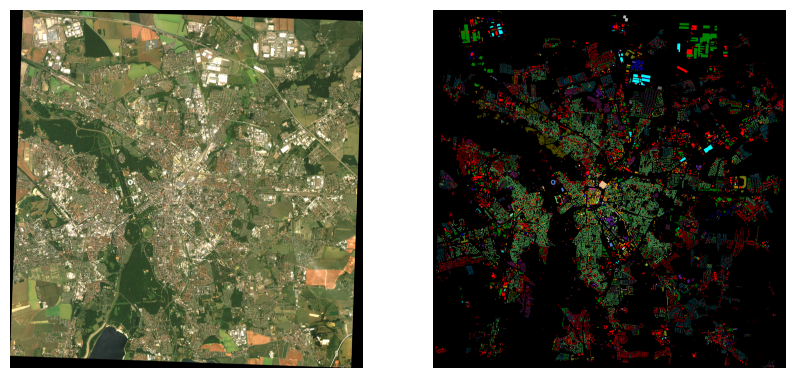

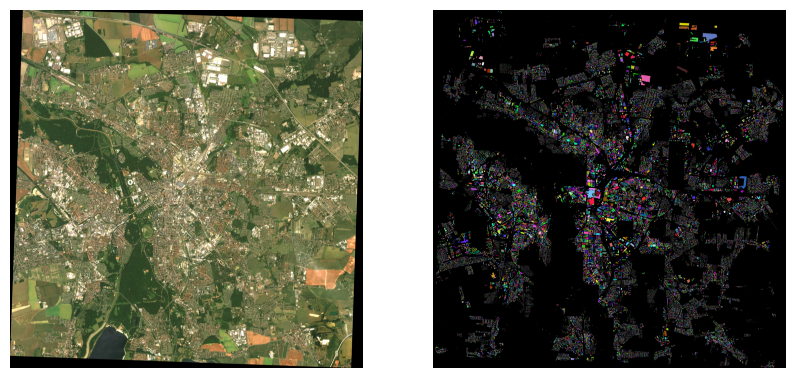

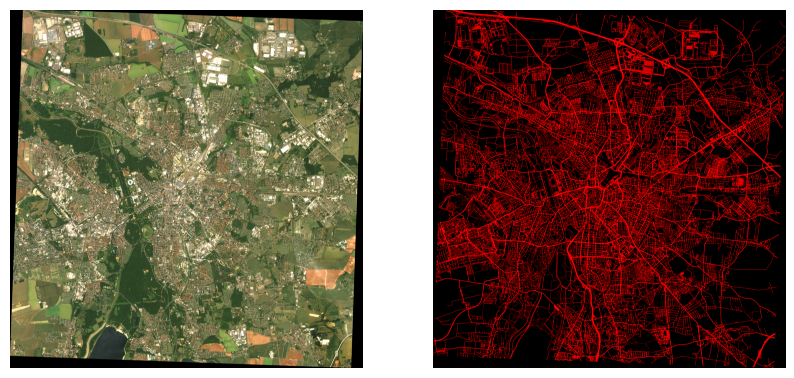

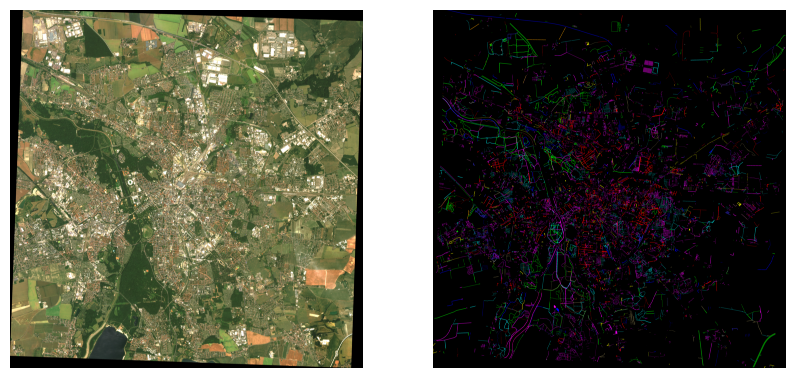

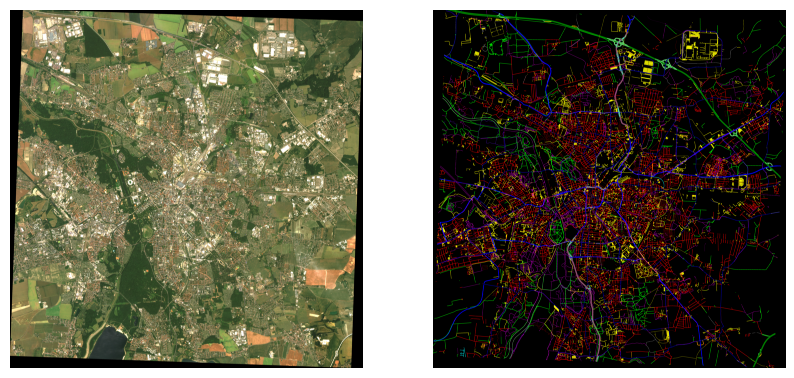

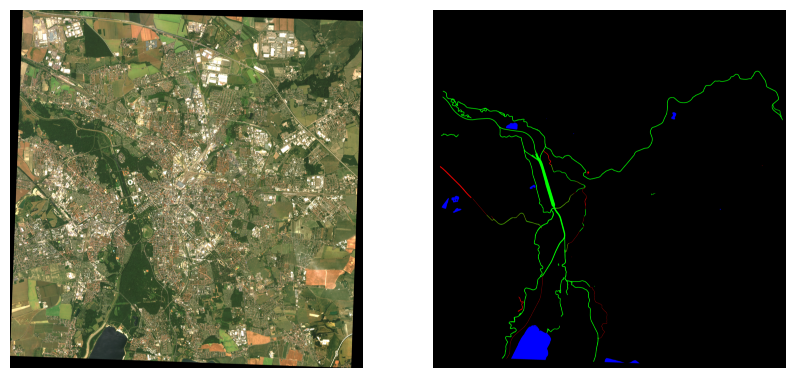

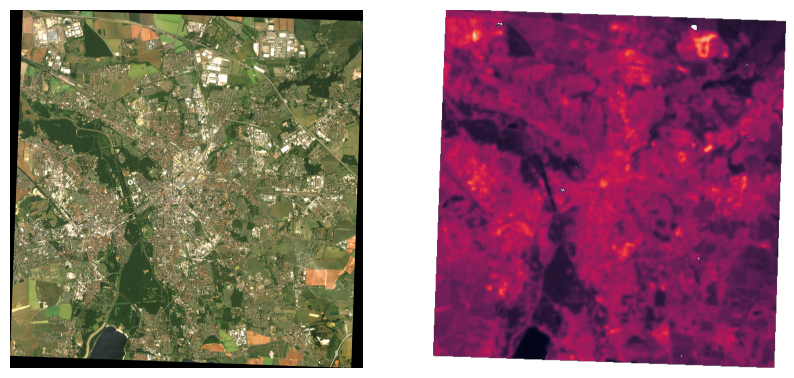

In [ ]:
def plot_side_by_side(images, cmap_secondary=None):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 5))
    for i, img in enumerate(images):
        if cmap_secondary is not None and i == 1:
            axes[i].imshow(img, cmap=cmap_secondary)
        else:
            axes[i].imshow(img)
        axes[i].axis('off')
    plt.show()

plot_side_by_side([rgb_image, ndvi_mask], cmap_secondary='RdYlGn')
plot_side_by_side([rgb_image, landuse_mask_rgb])
plot_side_by_side([rgb_image, shapes_mask_rgb])
plot_side_by_side([rgb_image, shapes_services_mask_rgb])
plot_side_by_side([rgb_image, shapes_height_mask_rgb])
plot_side_by_side([rgb_image, streets_mask_rgb])
plot_side_by_side([rgb_image, streets_surface_mask_rgb])
plot_side_by_side([rgb_image, streets_service_mask_rgb])
plot_side_by_side([rgb_image, water_mask_rgb])
plot_side_by_side([rgb_image, lst_mask], cmap_secondary='rocket')

In [ ]:
map = bbox_gdf.explore(color="blue")
clip_gdf.explore(color="red", m=map)